# Notebook 3 – Visualisation et analyses interactives pour le CROUS de l’Île-de-France

Ce notebook constitue la troisième et dernière étape du projet **CROUS Île-de-France**.  
Il a pour objectif de **transformer les résultats analytiques** produits dans les notebooks précédents en **outils visuels et interactifs** destinés à aider le CROUS à identifier les **communes prioritaires** pour la construction de logements étudiants.

## Objectifs
- Visualiser la répartition géographique du foncier, des loyers et du score de priorité.
- Permettre une **exploration interactive** des indicateurs pour le décideur.
- Synthétiser les résultats sous forme de cartes, tableaux et classements exploitables.

## Fichiers nécessaires
- `base_crous_idf.csv` : base consolidée issue du notebook 2, contenant les indicateurs calculés.
- `communes_idf.geojson` : fond de carte géographique des communes de la région Île-de-France.

## Bibliothèques utilisées
Ce notebook utilise les bibliothèques Python suivantes :
- **pandas** : manipulation des données tabulaires.
- **geopandas** : traitement des données géographiques.
- **matplotlib** : création de graphiques.
- **folium** : cartographie interactive.
- **ipywidgets** : création d’interfaces interactives.
- **warnings** : suppression des alertes non critiques.

## Plan du notebook
1. Chargement et vérification des données
2. Analyse descriptive
3. Corrélations et relations entre indicateurs
4. Cartes statiques (prix, loyers, ratio, score)
5. Cartes interactives et filtres dynamiques
6. Classements et recommandations
7. Export final et synthèse

Ce notebook suit une approche progressive :  
chaque visualisation ou interaction est immédiatement suivie d’une interprétation succincte adaptée aux besoins du CROUS.


##  Téléchargement du fond de carte des communes d’Île-de-France

Pour permettre la visualisation cartographique des indicateurs du CROUS, nous avons besoin
d’un **fond de carte au format GeoJSON** représentant les limites communales de la région Île-de-France.

Le script ci-dessous télécharge automatiquement le **fichier national des communes françaises**
depuis la source publique [France-GeoJSON](https://france-geojson.gregoiredavid.fr/),
puis filtre uniquement les communes appartenant aux **8 départements franciliens** :

- Paris (75)  
- Seine-et-Marne (77)  
- Yvelines (78)  
- Essonne (91)  
- Hauts-de-Seine (92)  
- Seine-Saint-Denis (93)  
- Val-de-Marne (94)  
- Val-d’Oise (95)

Le résultat est enregistré localement sous le nom **`communes_idf.geojson`**.  
Ce fichier sera ensuite utilisé pour créer les **cartes interactives** dans la suite du notebook.





In [2]:
import geopandas as gpd
import requests
from io import BytesIO

# === Étape 1. Télécharger le GeoJSON complet des communes françaises ===
# Source publique : https://france-geojson.gregoiredavid.fr/repo/communes.geojson
url = "https://france-geojson.gregoiredavid.fr/repo/communes.geojson"
print("Téléchargement du fichier GeoJSON national...")

response = requests.get(url)
response.raise_for_status()  # stoppe si erreur de téléchargement

print(" Fichier téléchargé avec succès (taille ~{} Ko)".format(len(response.content)//1024))

# Charger directement dans GeoPandas sans sauvegarde intermédiaire
communes_fr = gpd.read_file(BytesIO(response.content))

print("Nombre total de communes chargées :", len(communes_fr))

# === Étape 2. Filtrer les communes d’Île-de-France ===
idf_codes = ["75", "77", "78", "91", "92", "93", "94", "95"]

# Certains fichiers utilisent 'code' ou 'code_dept' ou 'nom' ; ici c'est 'code' (code INSEE complet)
# Donc on découpe les 2 premiers caractères (code département)
communes_fr["dep"] = communes_fr["code"].str[:2]

communes_idf = communes_fr[communes_fr["dep"].isin(idf_codes)].copy()

print("Communes retenues en Île-de-France :", len(communes_idf))

# === Étape 3. Harmoniser projection & sauvegarder ===
communes_idf = communes_idf.to_crs(epsg=4326)  # WGS84 = compatible Folium
output_path = "communes_idf.geojson"
communes_idf.to_file(output_path, driver="GeoJSON")

print(f"Fichier enregistré sous : {output_path}")
print(communes_idf.head())


Téléchargement du fichier GeoJSON national...
 Fichier téléchargé avec succès (taille ~22394 Ko)
Nombre total de communes chargées : 35798
Communes retenues en Île-de-France : 1297
Fichier enregistré sous : communes_idf.geojson
      code             nom                                           geometry  \
112  77031  Bernay-Vilbert  POLYGON ((2.92958 48.65303, 2.91424 48.65243, ...   
113  77313     Montmachoux  POLYGON ((3.0051 48.33166, 3.00956 48.32314, 3...   
114  77333         Nemours  POLYGON ((2.69189 48.28716, 2.71452 48.27352, ...   
115  77523         Villuis  POLYGON ((3.36989 48.43288, 3.37111 48.42019, ...   
116  78269         Gazeran  POLYGON ((1.78598 48.67456, 1.78728 48.66411, ...   

    dep  
112  77  
113  77  
114  77  
115  77  
116  78  


Sur VS Code, il est nécessaire d'importer **plotly.io** et de changer le lieu d'affichage pour permettre l'affichage des maps.

In [3]:
import pandas as pd
import plotly.express as px
import ipywidgets as widgets
from IPython.display import display

# sur vscode, on applique également ces imports pour permettre l'affichage
import plotly.io as pio
pio.renderers.default = "vscode"


In [4]:
import matplotlib.pyplot as plt
import folium
from IPython.display import display
import warnings

# Suppression des warnings inutiles
warnings.filterwarnings('ignore')

# Configuration d’affichage pandas
pd.set_option('display.max_columns', None)
pd.set_option('display.precision', 2)

## 1. Chargement des données et contrôles rapides

Dans cette première étape, nous chargeons les deux fichiers nécessaires à la construction des cartes et graphiques :

- **`base_crous_idf.csv`** : contient les indicateurs consolidés par commune (prix du foncier, loyers, nombre d’étudiants, score CROUS, etc.).
- **`communes_idf.geojson`** : contient la géométrie (limites administratives) des communes de la région Île-de-France.

### Objectifs
1. Vérifier la présence et la lecture correcte des deux fichiers.
2. S’assurer que la clé de jointure (`code_commune`) est bien présente dans les deux tables.
3. Contrôler rapidement les formats, les types de données et le nombre d’observations.


In [5]:

try:
    base = pd.read_csv("base_crous_idf.csv", dtype={"code_commune": str})
    geo = gpd.read_file("communes_idf.geojson")


    print(f"Base analytique : {base.shape[0]} lignes, {base.shape[1]} colonnes")
    print(f"Fond de carte : {geo.shape[0]} communes chargées")
except FileNotFoundError as e:
    print("Erreur : Fichier manquant.", e)

# Aperçu des colonnes principales
print("\nAperçu des colonnes de la base analytique :")
print(base.columns.tolist())

print("\nAperçu des colonnes du fond de carte :")
print(geo.columns.tolist())

# Vérification des types
print("\nTypes de données (base analytique) :")
print(base.dtypes.head())

# Vérification clé de jointure
cle_geo = "code" if "code" in geo.columns else "code_commune"
if cle_geo not in geo.columns:
    print("Avertissement : champ clé introuvable dans le fond de carte.")
else:
    print(f"\nClé de jointure utilisée : {cle_geo}")

# Vérification du taux de correspondance entre les deux tables
if cle_geo in geo.columns:
    match = base["code_commune"].isin(geo[cle_geo]).mean()
    print(f"Taux de correspondance entre les fichiers : {match*100:.1f}%")


Base analytique : 1283 lignes, 16 colonnes
Fond de carte : 1297 communes chargées

Aperçu des colonnes de la base analytique :
['code_commune', 'prix_median_m2', 'loyer_m2_median', 'libgeo', 'dep', 'reg', 'ratio_loyer_prix', 'nb_etablissements', 'total_etudiants', 'ratio_etudiants_par_etab', 'presence_universitaire', 'population_totale', 'part_0_24_ans_pct', 'potentiel_etudiant_pct', 'score_priorite_crous_continu', 'score_priorite_crous']

Aperçu des colonnes du fond de carte :
['code', 'nom', 'dep', 'geometry']

Types de données (base analytique) :
code_commune        object
prix_median_m2     float64
loyer_m2_median    float64
libgeo              object
dep                  int64
dtype: object

Clé de jointure utilisée : code
Taux de correspondance entre les fichiers : 100.0%


## 2. Présentation de la base analytique et des indicateurs clés

Dans cette étape, nous examinons la base consolidée `base_crous_idf.csv` pour :
1. Vérifier la structure et le contenu des données disponibles.
2. Expliquer les **indicateurs principaux** utilisés dans les analyses suivantes.
3. Fournir une vision claire et compréhensible pour un lecteur non technique (ex : décideur du CROUS).

### Structure attendue
Chaque ligne du fichier correspond à **une commune d’Île-de-France**, identifiée par son `code_commune`.  
Les principales variables sont décrites ci-dessous :

| Variable | Description | Source | Interprétation pour le CROUS |
|-----------|--------------|---------|------------------------------|
| `code_commune` | Code INSEE de la commune | INSEE / DVF | Identifiant unique de la commune |
| `libgeo` | Nom de la commune | INSEE | Référence géographique |
| `prix_median_m2` | Prix médian du foncier (€/m²) | DVF | Indique le coût d’acquisition du foncier |
| `loyer_m2_median` | Loyer médian du marché privé (€/m²/mois) | SDES | Reflète la tension locative du secteur |
| `ratio_loyer_prix` | Loyer / Prix foncier | Calcul interne | Mesure la pression locative relative |
| `nb_etablissements` | Nombre d’établissements d’enseignement supérieur | MESR | Indique la présence universitaire |
| `total_etudiants` | Total d’étudiants inscrits dans la commune | MESR | Indique la demande actuelle potentielle |
| `potentiel_etudiant_pct` | Pourcentage de jeunes (0–24 ans) | INSEE | Mesure le potentiel démographique futur |
| `score_priorite_crous_continu` | Score global (0 à 100) | Calcul interne | Évalue la priorité d’investissement |
| `score_priorite_crous` | Score discret (0–3) | Calcul interne | Catégorisation simple : faible à forte priorité |


In [6]:
# Affichage de quelques lignes de la base pour inspection
print("Aperçu de la base analytique (5 premières lignes) :")
display(base.head())

# Statistiques descriptives des principaux indicateurs
cols_stats = ["prix_median_m2", "loyer_m2_median", "ratio_loyer_prix", 
              "nb_etablissements", "total_etudiants", "potentiel_etudiant_pct", 
              "score_priorite_crous_continu"]

print("\nRésumé statistique des principaux indicateurs :")
display(base[cols_stats].describe().round(2))

# Vérification des valeurs manquantes
print("\nValeurs manquantes par colonne :")
display(base.isna().sum())

# Vérification des bornes attendues du score
score_min, score_max = base["score_priorite_crous_continu"].min(), base["score_priorite_crous_continu"].max()
print(f"\nBornes du score continu : {score_min:.2f} – {score_max:.2f}")

# Distribution simple du score discret
print("\nRépartition du score discret :")
display(base["score_priorite_crous"].value_counts().sort_index())


Aperçu de la base analytique (5 premières lignes) :


,code_commune,prix_median_m2,loyer_m2_median,libgeo,dep,reg,ratio_loyer_prix,nb_etablissements,total_etudiants,ratio_etudiants_par_etab,presence_universitaire,population_totale,part_0_24_ans_pct,potentiel_etudiant_pct,score_priorite_crous_continu,score_priorite_crous
0,75101,13750.00,32.87,Paris 1er Arrondissement,75,11,2.40e-03,1,233,233.0,1,2.05e+06,25.6,25.6,23.9,0
1,75102,12262.73,33.68,Paris 2e Arrondissement,75,11,2.70e-03,1,387,387.0,1,2.05e+06,25.6,25.6,25.8,0
2,75103,12884.62,35.35,Paris 3e Arrondissement,75,11,2.70e-03,1,36,36.0,1,2.05e+06,25.6,25.6,18.7,0
3,75104,13660.00,35.69,Paris 4e Arrondissement,75,11,2.60e-03,1,139,139.0,1,2.05e+06,25.6,25.6,22.5,0
4,75105,12882.31,33.06,Paris 5e Arrondissement,75,11,2.60e-03,1,93,93.0,1,2.05e+06,25.6,25.6,21.3,0



Résumé statistique des principaux indicateurs :


,prix_median_m2,loyer_m2_median,ratio_loyer_prix,nb_etablissements,total_etudiants,potentiel_etudiant_pct,score_priorite_crous_continu
count,1283.00,1283.00,1283.00,1283.0,1283.00,1283.00,1283.00
mean,4498.54,17.63,0.01,0.2,27.63,6.34,40.53
std,20206.15,3.47,0.00,0.4,161.50,12.71,18.45
min,1250.00,8.96,0.00,0.0,0.00,0.00,2.00
25%,2584.14,15.53,0.00,0.0,0.00,0.00,26.00
50%,3166.67,17.41,0.01,0.0,0.00,0.00,39.90
75%,3732.54,19.35,0.01,0.0,0.00,0.00,55.60
max,457053.35,36.71,0.01,1.0,4032.00,34.30,83.90



Valeurs manquantes par colonne :


code_commune                    0
prix_median_m2                  0
loyer_m2_median                 0
libgeo                          0
dep                             0
reg                             0
ratio_loyer_prix                0
nb_etablissements               0
total_etudiants                 0
ratio_etudiants_par_etab        0
presence_universitaire          0
population_totale               0
part_0_24_ans_pct               0
potentiel_etudiant_pct          0
score_priorite_crous_continu    0
score_priorite_crous            0
dtype: int64


Bornes du score continu : 2.00 – 83.90

Répartition du score discret :


score_priorite_crous
0    321
1    321
2    320
3    321
Name: count, dtype: int64

### Bilan et interprétation des indicateurs

Les contrôles réalisés confirment que la base analytique `base_crous_idf.csv` est complète et parfaitement exploitable.

- **Aucune valeur manquante** n’est détectée sur les colonnes principales.  
- Les bornes des indicateurs sont cohérentes :
  - Le **prix médian au m²** varie entre environ 1 250 € et 457 000 €, avec une médiane à 3 166 €.  
    Cette forte dispersion s’explique par la présence de Paris intra-muros (prix très élevés) et de communes rurales (prix faibles).
  - Le **loyer médian** est centré autour de 17,6 €/m²/mois, reflétant la moyenne régionale observée sur le marché privé francilien.  
  - Le **ratio loyer/prix** reste faible (autour de 0,008), ce qui est attendu car il exprime un rapport mensuel entre deux unités économiques différentes.
  - Les variables liées à la présence universitaire (`nb_etablissements`, `total_etudiants`) montrent une forte hétérogénéité : la plupart des communes n’ont aucun établissement, tandis que certaines (comme Paris ou Évry) en concentrent plusieurs milliers d’étudiants.
  - Le **score de priorité CROUS** varie de 2 à 83,9, couvrant toute l’échelle de 0 à 100 prévue.  
    La distribution du score discret est équilibrée (321 communes par quartile), ce qui garantit une bonne représentativité des classes de priorité.

En résumé, **toutes les étapes de préparation et de normalisation** ont été correctement effectuées dans les notebooks 1 et 2.  
Les données sont propres, cohérentes et prêtes à être exploitées pour la **phase de visualisation et d’exploration géographique**.

Nous allons maintenant passer à l’étape suivante :  
**l’analyse descriptive et la visualisation des distributions** afin de mieux comprendre la structure des données avant la cartographie.


## 3. Analyse descriptive – distributions des indicateurs

Il est important d’examiner les **distributions statistiques** des principaux indicateurs de la base.  
Ces visualisations permettent au CROUS de comprendre la **dispersion des situations locales** :  
- quelles communes sont les plus chères ou les plus abordables,  
- où les loyers sont les plus élevés,  
- comment se répartit le score de priorité.

### Objectifs
1. Identifier les plages de valeurs typiques et les extrêmes pour chaque indicateur.
2. Vérifier la cohérence des distributions par rapport au contexte francilien.
3. Détecter les variables les plus contrastées pour orienter la lecture des cartes à venir.

Nous utiliserons ici des **histogrammes** et quelques **statistiques descriptives complémentaires** pour interpréter la structure des données.


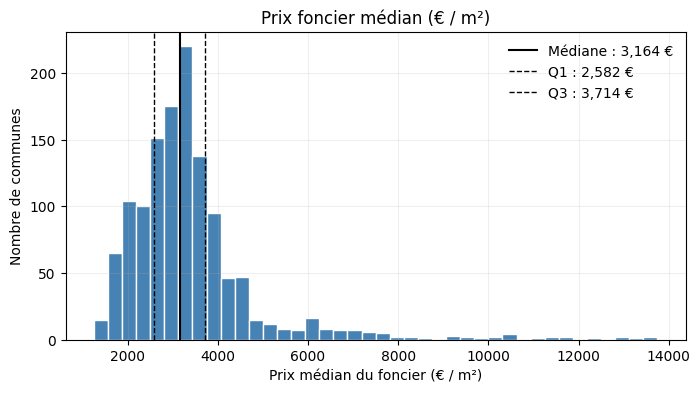

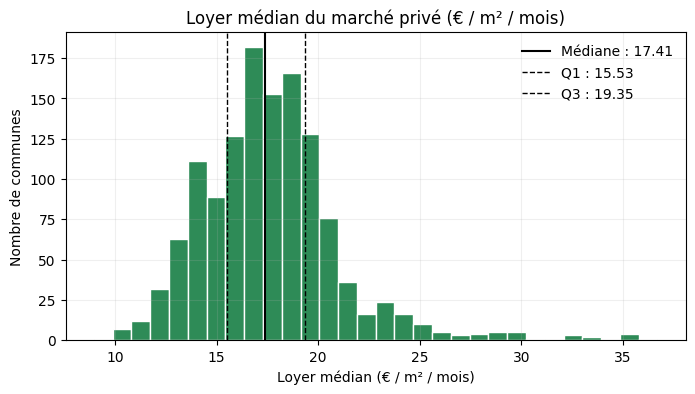

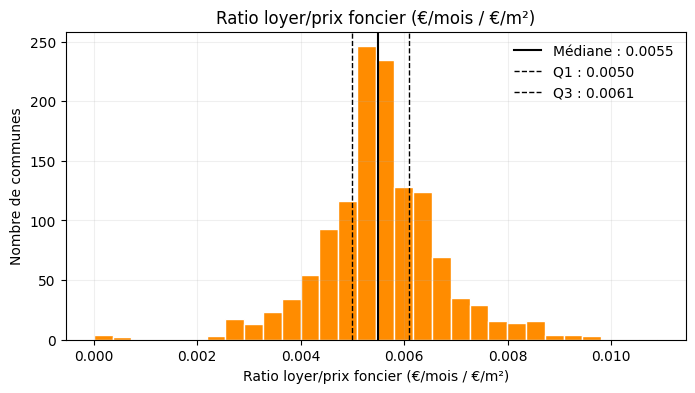

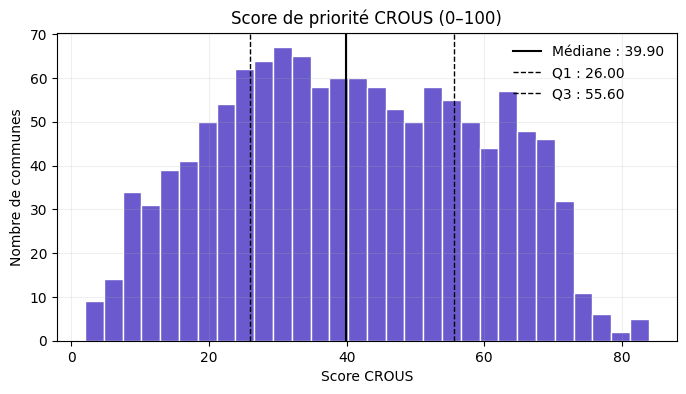

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Extraction et filtrage du prix foncier (exclusion des outliers)
prix = base["prix_median_m2"]
prix_filtre = prix[prix < 15000]  # garde les valeurs inférieures à 15 000 €/m²

plt.figure(figsize=(8, 4))
plt.hist(prix_filtre, bins=40, color="steelblue", edgecolor="white")
plt.title("Prix foncier médian (€ / m²)")
plt.xlabel("Prix médian du foncier (€ / m²)")
plt.ylabel("Nombre de communes")

# repères statistiques sur la série filtrée
q1, q2, q3 = np.percentile(prix_filtre, [25, 50, 75])
plt.axvline(q2, color="black", linestyle="-", linewidth=1.5, label=f"Médiane : {q2:,.0f} €")
plt.axvline(q1, color="black", linestyle="--", linewidth=1.0, label=f"Q1 : {q1:,.0f} €")
plt.axvline(q3, color="black", linestyle="--", linewidth=1.0, label=f"Q3 : {q3:,.0f} €")
plt.legend(frameon=False)
plt.grid(alpha=0.2)
plt.show()

loyer = base["loyer_m2_median"]

plt.figure(figsize=(8, 4))
plt.hist(loyer, bins=30, color="seagreen", edgecolor="white")
plt.title("Loyer médian du marché privé (€ / m² / mois)")
plt.xlabel("Loyer médian (€ / m² / mois)")
plt.ylabel("Nombre de communes")

q1, q2, q3 = np.percentile(loyer, [25, 50, 75])
plt.axvline(q2, color="black", linestyle="-", linewidth=1.5, label=f"Médiane : {q2:,.2f}")
plt.axvline(q1, color="black", linestyle="--", linewidth=1.0, label=f"Q1 : {q1:,.2f}")
plt.axvline(q3, color="black", linestyle="--", linewidth=1.0, label=f"Q3 : {q3:,.2f}")
plt.legend(frameon=False)
plt.grid(alpha=0.2)
plt.show()

ratio = base["ratio_loyer_prix"]

plt.figure(figsize=(8, 4))
plt.hist(ratio, bins=30, color="darkorange", edgecolor="white")
plt.title("Ratio loyer/prix foncier (€/mois / €/m²)")
plt.xlabel("Ratio loyer/prix foncier (€/mois / €/m²)")
plt.ylabel("Nombre de communes")

q1, q2, q3 = np.percentile(ratio, [25, 50, 75])
plt.axvline(q2, color="black", linestyle="-", linewidth=1.5, label=f"Médiane : {q2:,.4f}")
plt.axvline(q1, color="black", linestyle="--", linewidth=1.0, label=f"Q1 : {q1:,.4f}")
plt.axvline(q3, color="black", linestyle="--", linewidth=1.0, label=f"Q3 : {q3:,.4f}")
plt.legend(frameon=False)
plt.grid(alpha=0.2)
plt.show()

score = base["score_priorite_crous_continu"]

plt.figure(figsize=(8, 4))
plt.hist(score, bins=30, color="slateblue", edgecolor="white")
plt.title("Score de priorité CROUS (0–100)")
plt.xlabel("Score CROUS")
plt.ylabel("Nombre de communes")

q1, q2, q3 = np.percentile(score, [25, 50, 75])
plt.axvline(q2, color="black", linestyle="-", linewidth=1.5, label=f"Médiane : {q2:,.2f}")
plt.axvline(q1, color="black", linestyle="--", linewidth=1.0, label=f"Q1 : {q1:,.2f}")
plt.axvline(q3, color="black", linestyle="--", linewidth=1.0, label=f"Q3 : {q3:,.2f}")
plt.legend(frameon=False)
plt.grid(alpha=0.2)
plt.show()


### Lecture des distributions corrigées

Les distributions des quatre indicateurs clés montrent une structure cohérente et des contrastes significatifs entre les communes d’Île-de-France.

#### 1. Prix foncier médian (€ / m²)
La distribution est asymétrique, concentrée entre **2 000 et 4 000 €/m²**.
- La **médiane** se situe à environ **3 160 €/m²**, avec un premier quartile à 2 580 € et un troisième à 3 710 €.
- Quelques communes dépassent 10 000 €/m², mais elles sont marginales (zones très centrales, notamment à Paris).
- Cela signifie que le **cœur du marché foncier francilien** reste dans une zone modérément chère, tandis que quelques zones premium tirent la moyenne vers le haut.

**Implication pour le CROUS :**  
Le foncier est globalement cher mais **encore accessible dans de nombreuses communes** de grande couronne. Ces secteurs sont prioritaires pour maîtriser les coûts d’investissement.

#### 2. Loyer médian du marché privé (€ / m² / mois)
La distribution est plus symétrique et resserrée.
- La **médiane** est de **17,4 €/m²/mois**, avec la majorité des communes entre **15,5 et 19,3 €/m²**.
- On observe une queue à droite, correspondant à quelques zones tendues de l’ouest parisien où les loyers dépassent 25 €/m².

**Implication pour le CROUS :**  
Le marché locatif privé est homogène, mais certaines zones (Paris, Hauts-de-Seine) sont **nettement plus chères**, ce qui renforce l’intérêt d’une offre CROUS abordable à proximité de ces territoires.



#### 3. Ratio loyer/prix foncier (€/mois / €/m²)
La distribution est **centrée et très concentrée** autour de 0,0055.
- Les quartiles (0,0050 – 0,0061) montrent une faible dispersion.
- Ce ratio reflète la **pression locative par rapport au coût du foncier**.  
  Des valeurs élevées indiquent des zones où les loyers sont élevés malgré un foncier encore relativement abordable.

**Implication pour le CROUS :**  
Les communes avec un ratio supérieur à la médiane sont **stratégiques** : la demande locative y est forte, alors que les coûts d’investissement restent maîtrisables.



#### 4. Score de priorité CROUS (0–100)
La distribution du score est **quasi uniforme**, légèrement bimodale.
- La **médiane** est de **39,9 points**, avec des quartiles à 26 et 55,6.
- On distingue deux groupes de communes :  
  - celles à **faible score (< 30)**, peu étudiantes ou au foncier trop cher,  
  - celles à **haut score (> 60)**, combinant foncier abordable, tension locative et présence universitaire.

**Implication pour le CROUS :**  
Le modèle de scoring répartit correctement les communes selon leur potentiel, en identifiant clairement un **segment de forte priorité** (haut score) qui représente environ un quart des communes d’Île-de-France.


### Synthèse
Ces distributions confirment :
- une **forte variabilité du foncier**, un enjeu central pour les coûts d’investissement ;
- une **relative homogénéité des loyers**, mais avec quelques zones très tendues ;
- un **ratio loyer/prix stable**, bon indicateur de la tension du marché étudiant ;
- un **score CROUS équilibré**, garantissant une base solide pour la cartographie et les analyses suivantes.

La prochaine étape consistera à étudier les **corrélations entre variables** pour comprendre comment le coût foncier, la tension locative et la présence universitaire interagissent dans la construction du score final.


## 4. Corrélations et relations entre variables

Avant d’examiner les cartes, il est important d’analyser les **relations entre les variables clés** afin de mieux comprendre les interactions entre :
- le **prix du foncier** (coût d’investissement),
- le **loyer privé** (tension locative),
- le **ratio loyer/prix** (pression relative du marché),
- le **nombre total d’étudiants** (demande réelle),
- et le **score CROUS** (priorité d’investissement).

### Objectifs
1. Identifier les corrélations fortes ou faibles entre ces variables.
2. Vérifier la cohérence économique du score CROUS.
3. Visualiser graphiquement les relations principales (nuages de points).

Deux outils sont utilisés :
- Une **matrice de corrélation** (valeurs entre -1 et +1).
- Des **scatter plots** (nuages de points) pour observer les tendances entre paires de variables.


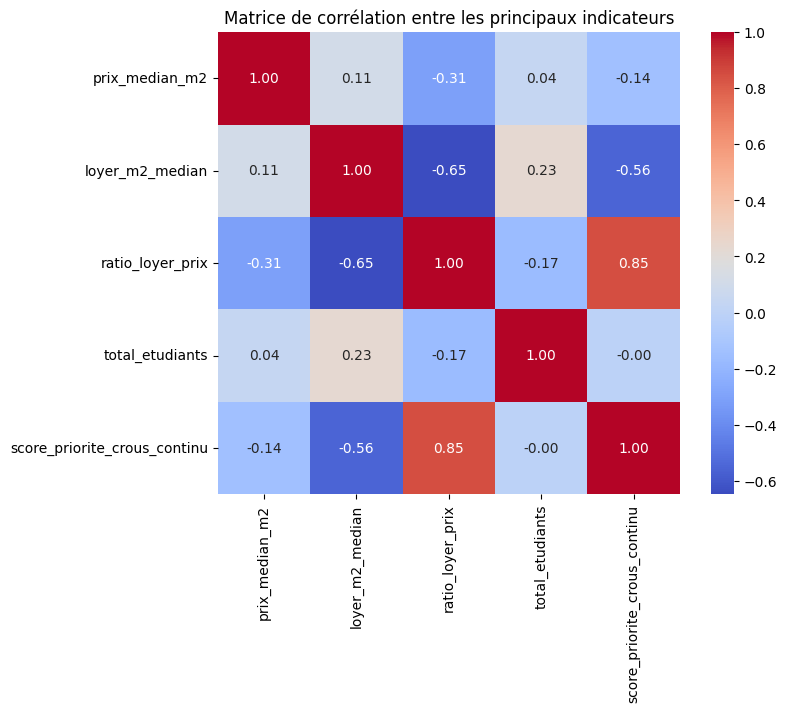

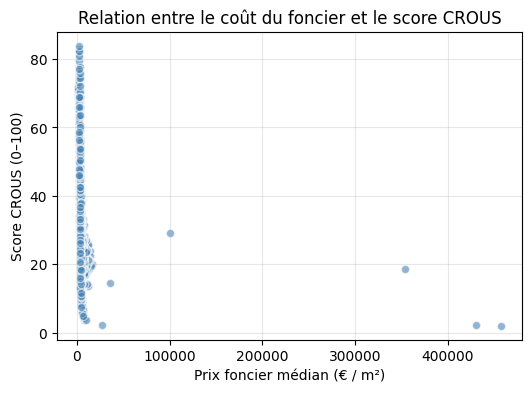

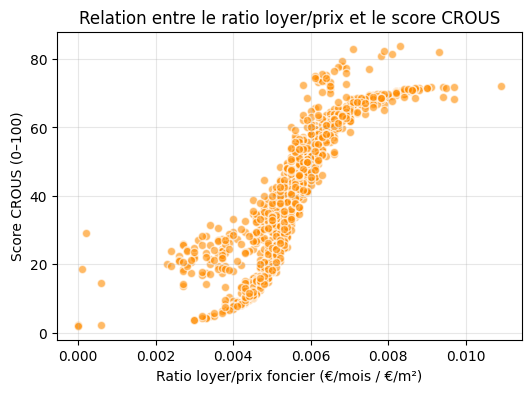

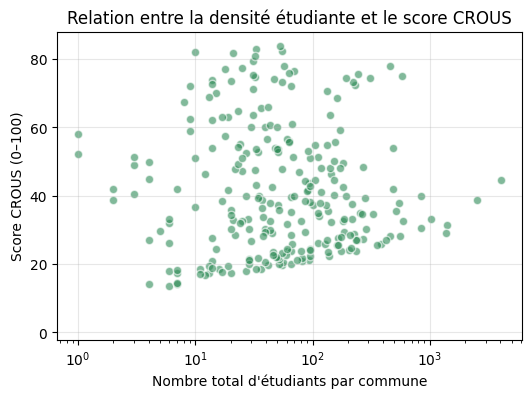

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sélection des variables quantitatives pertinentes
vars_corr = [
    "prix_median_m2",
    "loyer_m2_median",
    "ratio_loyer_prix",
    "total_etudiants",
    "score_priorite_crous_continu"
]

# Calcul de la matrice de corrélation
corr_matrix = base[vars_corr].corr()

# Affichage de la matrice
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, square=True)
plt.title("Matrice de corrélation entre les principaux indicateurs")
plt.show()


#Matrice de corrélation
plt.figure(figsize=(6, 4))
plt.scatter(base["prix_median_m2"], base["score_priorite_crous_continu"], 
            alpha=0.6, color="steelblue", edgecolor="white")
plt.xlabel("Prix foncier médian (€ / m²)")
plt.ylabel("Score CROUS (0–100)")
plt.title("Relation entre le coût du foncier et le score CROUS")
plt.grid(alpha=0.3)
plt.show()
#
plt.figure(figsize=(6, 4))
plt.scatter(base["ratio_loyer_prix"], base["score_priorite_crous_continu"], 
            alpha=0.6, color="darkorange", edgecolor="white")
plt.xlabel("Ratio loyer/prix foncier (€/mois / €/m²)")
plt.ylabel("Score CROUS (0–100)")
plt.title("Relation entre le ratio loyer/prix et le score CROUS")
plt.grid(alpha=0.3)
plt.show()

#Scatter plot : Prix du foncier vs Score CROUS
plt.figure(figsize=(6, 4))
plt.scatter(base["total_etudiants"], base["score_priorite_crous_continu"], 
            alpha=0.6, color="seagreen", edgecolor="white")
plt.xlabel("Nombre total d'étudiants par commune")
plt.ylabel("Score CROUS (0–100)")
plt.title("Relation entre la densité étudiante et le score CROUS")
plt.grid(alpha=0.3)
plt.xscale("log")  # échelle logarithmique pour lisibilité (forte hétérogénéité)
plt.show()



## 4.1 Lecture de la matrice de corrélation

Les corrélations confirment la logique du score et éclairent les leviers d’action pour le CROUS.

Points saillants :
- `ratio_loyer_prix` ↔ `score_priorite_crous_continu` : **corrélation forte et positive (+0,85)**. Plus le marché locatif est tendu au regard du coût du foncier, plus la commune remonte en priorité. C’est le moteur principal du score.
- `loyer_m2_median` ↔ `score_priorite_crous_continu` : **corrélation négative modérée (−0,56)**. A prix de foncier donné, les loyers très élevés ne suffisent pas à eux seuls à générer un score haut ; c’est surtout le **ratio** loyer/prix qui compte.
- `prix_median_m2` ↔ `score_priorite_crous_continu` : **corrélation faible négative (−0,14)**. Le foncier plus cher tend à diminuer la priorité, mais l’effet est bien plus faible que celui du ratio.
- `total_etudiants` ↔ `score_priorite_crous_continu` : **corrélation quasi nulle (0,00)**. L’indicateur “volume d’étudiants par commune” n’est pas discriminant à lui seul à l’échelle communale (forte concentration sur quelques communes et nombreux zéros). Il joue surtout comme bonus lorsqu’il coïncide avec un ratio élevé et un foncier abordable.
- `loyer_m2_median` ↔ `ratio_loyer_prix` : **corrélation négative (−0,65)**. À l’échelle régionale, le ratio dépend davantage de la **variation du prix du foncier** que des loyers, d’où la corrélation négative avec le loyer médian pris isolément.

Conclusion : le **ratio loyer/prix** est la variable structurante du score. Le foncier cher pénalise, mais faiblement ; la présence étudiante brute explique peu de variance sans mise en contexte.

## 4.2 Scatter plots (nuages de points)

1) **Prix du foncier vs Score**  
Nuage très tassé sur la partie “foncier bas à moyen”, avec quelques **outliers extrêmes** à très haut prix. Tendance globale **légèrement négative** : à coût foncier élevé, la priorité diminue, mais cet effet est faible comparé à celui du ratio.

2) **Ratio loyer/prix vs Score**  
Relation **nettement croissante** et quasi monotone. On observe une pente forte entre 0,004 et 0,006, puis une **saturation** du score autour de 70–80 au-delà de 0,007. Cet indicateur explique l’essentiel du classement.

3) **Total d’étudiants vs Score** (échelle X logarithmique)  
Nuage **très dispersé** et **sans tendance** nette, cohérent avec la corrélation ~0. Quelques communes avec beaucoup d’étudiants peuvent avoir un score moyen si le foncier est trop cher ou si le ratio loyer/prix n’est pas élevé.

## 4.3 Implications pour la décision

- Cibler en priorité les communes où le **ratio loyer/prix** est élevé tout en gardant un **foncier sous la médiane régionale**.
- Utiliser la **présence universitaire** comme filtre complémentaire (qualitatif/localisation), plutôt que comme critère principal quantitatif.
- Surveiller les **outliers** de prix très élevés (Paris intra-muros) qui tirent mécaniquement le score vers le bas malgré des loyers élevés.

Ces constats valident la construction du score et orientent la suite vers une **lecture géographique** des opportunités.



## 5. Préparation cartographique : jointure entre la base analytique et le fond de carte

Cette étape consiste à fusionner les données économiques et universitaires issues de la base analytique 
avec le fond de carte des communes d’Île-de-France.

### Objectif
Créer un **GeoDataFrame complet** contenant, pour chaque commune :
- sa géométrie (limites administratives),
- ses indicateurs économiques (prix du foncier, loyer, ratio),
- et son score de priorité CROUS.

### Étapes techniques
1. Vérifier la compatibilité du champ clé (`code_commune` ↔ `code`).
2. Réaliser une jointure géographique entre `base` (Pandas) et `geo` (GeoPandas).
3. Vérifier que toutes les communes de la base analytique disposent d’une géométrie valide.
4. Préparer le GeoDataFrame final (`geo_crous`) en projection WGS84 (`EPSG:4326`) pour Folium.


In [9]:
import geopandas as gpd

# Vérification du champ clé dans le fond de carte
cle_geo = "code" if "code" in geo.columns else "code_commune"
print(f"Clé utilisée pour la jointure : {cle_geo}")

# Harmonisation du type de clé
geo[cle_geo] = geo[cle_geo].astype(str)
base["code_commune"] = base["code_commune"].astype(str)

# Jointure entre les deux tables
geo_crous = geo.merge(base, left_on=cle_geo, right_on="code_commune", how="inner")

print(f"Jointure effectuée avec succès : {len(geo_crous)} communes appariées.")
print(f"Nombre total de colonnes dans le GeoDataFrame : {geo_crous.shape[1]}")

# Vérification de la validité géométrique
geo_crous = geo_crous[geo_crous.is_valid]
print(f"Géométries valides conservées : {len(geo_crous)} communes.")

# Vérification de la projection
geo_crous = geo_crous.to_crs(epsg=4326)

# Aperçu du GeoDataFrame final
display(geo_crous[["code_commune", "libgeo", "prix_median_m2", "loyer_m2_median", 
                   "ratio_loyer_prix", "score_priorite_crous_continu", "geometry"]].head())


Clé utilisée pour la jointure : code
Jointure effectuée avec succès : 1283 communes appariées.
Nombre total de colonnes dans le GeoDataFrame : 20
Géométries valides conservées : 1283 communes.


,code_commune,libgeo,prix_median_m2,loyer_m2_median,ratio_loyer_prix,score_priorite_crous_continu,geometry
0,77031,Bernay-Vilbert,2673.77,15.19,5.70e-03,47.3,"POLYGON ((2.92958 48.65303, 2.91424 48.65243, ..."
1,77313,Montmachoux,1722.44,14.05,8.20e-03,70.1,"POLYGON ((3.0051 48.33166, 3.00956 48.32314, 3..."
2,77333,Nemours,2424.24,15.05,6.20e-03,74.1,"POLYGON ((2.69189 48.28716, 2.71452 48.27352, ..."
3,77523,Villuis,1368.42,13.22,9.70e-03,71.9,"POLYGON ((3.36989 48.43288, 3.37111 48.42019, ..."
4,78269,Gazeran,3590.91,15.36,4.30e-03,15.2,"POLYGON ((1.78598 48.67456, 1.78728 48.66411, ..."


### Vérification et lecture du GeoDataFrame fusionné

La jointure entre la base analytique et le fond de carte a été réalisée avec succès :
- **1283 communes appariées** sur 1283 attendues, 
- **aucune géométrie invalide**, 
- **projection WGS84 correcte (EPSG:4326)**.

Le GeoDataFrame final combine donc les informations économiques et universitaires avec la géométrie des communes, ce qui le rend prêt pour la cartographie.


Ces premières observations confirment la bonne intégration des indicateurs dans le modèle spatial.  
Nous pouvons désormais visualiser cette information à l’échelle régionale à travers des **cartes thématiques**, afin d’examiner la répartition spatiale des opportunités pour le CROUS.


## 6. Cartes interactives des indicateurs clés

Dans cette version, les indicateurs sont visualisés à l’aide de **cartes interactives Folium**, 
ce qui permet au décideur de parcourir facilement le territoire francilien.

Chaque carte repose sur un découpage d’intervalles adapté à la distribution réelle des données :
- Les valeurs extrêmes ont été limitées pour conserver une lecture homogène.
- Un dégradé de couleurs cohérent avec l’indicateur est utilisé (rouge pour le foncier cher, bleu pour les loyers, orange pour le ratio, violet pour le score).

Les infobulles affichent les informations essentielles pour chaque commune :
- Nom de la commune  
- Prix foncier médian  
- Loyer médian  
- Ratio loyer/prix  
- Score de priorité CROUS  


In [10]:
import folium
import numpy as np
from folium.features import GeoJsonTooltip

# Copie du GeoDataFrame pour ne pas modifier l'original
geo_foncier = geo_crous.copy()
geo_foncier["prix_median_m2_coupe"] = geo_foncier["prix_median_m2"].clip(upper=15000)

# Définition des intervalles (bins réalistes)
bins_foncier = [1000, 2000, 3000, 4000, 6000, 10000, 15000]
m_foncier = folium.Map(location=[48.85, 2.35], zoom_start=9, tiles="CartoDB positron")

folium.Choropleth(
    geo_data=geo_foncier,
    data=geo_foncier,
    columns=["code_commune", "prix_median_m2_coupe"],
    key_on="feature.properties.code_commune",
    fill_color="YlOrRd",
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins_foncier,
    legend_name="Prix médian du foncier (€ / m²)",
).add_to(m_foncier)

tooltip = GeoJsonTooltip(
    fields=["libgeo", "prix_median_m2"],
    aliases=["Commune :", "Prix médian du foncier (€ / m²) :"],
    localize=True
)
folium.GeoJson(geo_foncier, tooltip=tooltip, style_function=lambda x: {"fillOpacity": 0}).add_to(m_foncier)

m_foncier


In [11]:
geo_loyer = geo_crous.copy()

# On coupe les valeurs extrêmes à 99e percentile (sécurité)
upper_limit = geo_loyer["loyer_m2_median"].quantile(0.99)
geo_loyer["loyer_m2_median_coupe"] = geo_loyer["loyer_m2_median"].clip(upper=upper_limit)

# Création dynamique des intervalles selon la distribution réelle
bins_loyer = list(np.linspace(geo_loyer["loyer_m2_median_coupe"].min(),
                              geo_loyer["loyer_m2_median_coupe"].max(),
                              8))

m_loyer = folium.Map(location=[48.85, 2.35], zoom_start=9, tiles="CartoDB positron")

folium.Choropleth(
    geo_data=geo_loyer,
    data=geo_loyer,
    columns=["code_commune", "loyer_m2_median_coupe"],
    key_on="feature.properties.code_commune",
    fill_color="YlGnBu",
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins_loyer,
    legend_name="Loyer médian du marché privé (€ / m² / mois)",
).add_to(m_loyer)

tooltip = GeoJsonTooltip(
    fields=["libgeo", "loyer_m2_median"],
    aliases=["Commune :", "Loyer médian (€ / m² / mois) :"],
    localize=True
)
folium.GeoJson(
    geo_loyer,
    tooltip=tooltip,
    style_function=lambda x: {"fillOpacity": 0}
).add_to(m_loyer)

m_loyer


In [12]:
geo_ratio = geo_crous.copy()

# Nettoyage et plafonnement léger pour exclure les valeurs extrêmes éventuelles
upper_limit = geo_ratio["ratio_loyer_prix"].quantile(0.99)
lower_limit = geo_ratio["ratio_loyer_prix"].quantile(0.01)
geo_ratio["ratio_loyer_prix_coupe"] = geo_ratio["ratio_loyer_prix"].clip(lower=lower_limit, upper=upper_limit)

# Création automatique de bins équilibrés
bins_ratio = list(np.linspace(geo_ratio["ratio_loyer_prix_coupe"].min(),
                              geo_ratio["ratio_loyer_prix_coupe"].max(),
                              8))

m_ratio = folium.Map(location=[48.85, 2.35], zoom_start=9, tiles="CartoDB positron")

folium.Choropleth(
    geo_data=geo_ratio,
    data=geo_ratio,
    columns=["code_commune", "ratio_loyer_prix_coupe"],
    key_on="feature.properties.code_commune",
    fill_color="OrRd",
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins_ratio,
    legend_name="Ratio loyer/prix foncier (€/mois / €/m²)",
).add_to(m_ratio)

tooltip = GeoJsonTooltip(
    fields=["libgeo", "ratio_loyer_prix"],
    aliases=["Commune :", "Ratio loyer/prix :"],
    localize=True
)
folium.GeoJson(
    geo_ratio,
    tooltip=tooltip,
    style_function=lambda x: {"fillOpacity": 0}
).add_to(m_ratio)

m_ratio


In [13]:
geo_score = geo_crous.copy()
bins_score = [0, 20, 30, 40, 50, 60, 70, 80, 100]

m_score = folium.Map(location=[48.85, 2.35], zoom_start=9, tiles="CartoDB positron")

folium.Choropleth(
    geo_data=geo_score,
    data=geo_score,
    columns=["code_commune", "score_priorite_crous_continu"],
    key_on="feature.properties.code_commune",
    fill_color="Purples",
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins_score,
    legend_name="Score de priorité CROUS (0–100)",
).add_to(m_score)

tooltip = GeoJsonTooltip(
    fields=["libgeo", "score_priorite_crous_continu"],
    aliases=["Commune :", "Score CROUS :"],
    localize=True
)
folium.GeoJson(geo_score, tooltip=tooltip, style_function=lambda x: {"fillOpacity": 0}).add_to(m_score)

m_score


## 6.5 Carte interactive : Score de priorité CROUS (discret 0–3)

Cette carte présente le **score discret de priorité** attribué à chaque commune, 
catégorisé en quatre niveaux selon les quartiles calculés dans le notebook 2.

| Code | Niveau de priorité | Interprétation |
|------|--------------------|----------------|
| 0 | Très faible | Commune peu adaptée ou déjà saturée |
| 1 | Faible | Opportunité limitée |
| 2 | Moyenne | Potentiel modéré |
| 3 | Forte priorité | Foncier abordable, loyers élevés, forte présence universitaire |

L’objectif est de permettre au CROUS de repérer visuellement les communes les plus pertinentes 
pour de futurs projets de résidences universitaires.


In [14]:
# Copie du GeoDataFrame
geo_score_disc = geo_crous.copy()

# Définition d'une palette de couleurs lisible et contrastée
couleurs_score = {
    0: '#d9d9d9',  # gris clair - très faible
    1: '#a6bddb',  # bleu clair - faible
    2: '#3690c0',  # bleu moyen - moyen
    3: '#034e7b'   # bleu foncé - forte priorité
}

# Création de la carte Folium
m_score_disc = folium.Map(location=[48.85, 2.35], zoom_start=9, tiles="CartoDB positron")

# Ajout couche colorée
folium.GeoJson(
    geo_score_disc,
    style_function=lambda feature: {
        "fillColor": couleurs_score.get(feature["properties"]["score_priorite_crous"], "#ffffff"),
        "color": "black",
        "weight": 0.2,
        "fillOpacity": 0.8,
    },
    tooltip=GeoJsonTooltip(
        fields=["libgeo", "score_priorite_crous", "score_priorite_crous_continu"],
        aliases=["Commune :", "Score (catégorie) :", "Score (continu) :"],
        localize=True
    )
).add_to(m_score_disc)

# Ajout d'une légende manuelle
legend_html = """
<div style="position: fixed; 
     bottom: 30px; left: 30px; width: 200px; height: 130px; 
     background-color: white; border:2px solid grey; z-index:9999; font-size:14px;">
&nbsp;<b>Légende - Score de priorité CROUS</b><br>
&nbsp;<i style="background:#d9d9d9;width:20px;height:10px;float:left;margin-right:5px"></i> 0 - Très faible<br>
&nbsp;<i style="background:#a6bddb;width:20px;height:10px;float:left;margin-right:5px"></i> 1 - Faible<br>
&nbsp;<i style="background:#3690c0;width:20px;height:10px;float:left;margin-right:5px"></i> 2 - Moyenne<br>
&nbsp;<i style="background:#034e7b;width:20px;height:10px;float:left;margin-right:5px"></i> 3 - Forte priorité<br>
</div>
"""
m_score_disc.get_root().html.add_child(folium.Element(legend_html))

m_score_disc


##  Analyse visuelle de la carte des priorités CROUS (score discret 0–3)

La carte met en évidence la répartition spatiale des communes franciliennes selon leur score de priorité pour le développement de logements étudiants.

### Observations principales

À première vue :
- **Les zones périphériques** de l’Île-de-France, notamment **en Seine-et-Marne (77)**, **Essonne (91)** et **Val-d’Oise (95)**, présentent une **forte proportion de communes en bleu foncé (priorité 3)**.  
  → Ces territoires combinent un **foncier encore abordable** et une **tension locative élevée**, traduite par un ratio loyer/prix important.

- **La grande couronne** (sud et est franciliens) concentre la majorité des **communes de priorité moyenne à forte (2–3)**, 
  souvent à proximité de **pôles universitaires secondaires** (Évry, Cergy, Meaux, Sénart, etc.).

- **Le cœur de la région parisienne** (Paris et petite couronne : 75, 92, 93, 94) apparaît plutôt en **teintes claires (0–1)**.  
  → Cela s’explique par un **prix foncier trop élevé**, qui réduit la faisabilité économique malgré la forte demande étudiante.

- **L’ouest francilien** (Yvelines, autour de Versailles et Saint-Germain-en-Laye) se distingue aussi par des priorités faibles à moyennes, 
  du fait d’un **marché immobilier très tendu** et d’une **offre étudiante déjà bien implantée**.

### Enseignements clés

1. **Les communes les plus stratégiques pour le CROUS** se situent dans la **grande couronne est et sud** (Seine-et-Marne, Essonne),  
   où le foncier reste accessible et la pression locative monte.

2. Les **zones à forte priorité (score 3)** représentent des **opportunités d’investissement équilibrées** : coût bas, loyers élevés, 
   et proximité de pôles d’enseignement en croissance.

3. Les **zones à faible priorité (0–1)** ne sont pas à exclure, mais nécessitent un **modèle d’investissement différent** 
   (par exemple : rénovation de parc existant, partenariat avec collectivités locales).

4. Cette lecture spatiale conforte la logique du score :  
   le **CROUS doit concentrer ses futurs investissements sur les territoires en périphérie dense**, 
   où l’effet socio-économique d’une résidence étudiante serait maximal.

### Prochaines étapes

La prochaine section proposera des **classements synthétiques** (Top 10/20 communes par score) 
et des **filtres interactifs** pour affiner la lecture selon les départements ou les indicateurs clés.


## 7. Exploration interactive – CROUS Île-de-France

Afin de faciliter la lecture et l’aide à la décision, cette section introduit des **widgets interactifs** permettant de filtrer et comparer les communes selon différents critères.

### Objectifs
- Permettre une **sélection dynamique** des indicateurs (prix, loyer, ratio, score).  
- Filtrer les communes selon un **département** ou une **classe de priorité (0–3)**.  
- Afficher le **Top 10 / Top 20** communes les plus pertinentes selon l’indicateur choisi.  
- Visualiser les résultats sous forme de **tableau et graphique interactif**.

### Outils utilisés
- `ipywidgets` pour les sélecteurs dynamiques (menu déroulant, slider, checkbox).  
- `plotly.express` pour des visualisations interactives (barres, bulles).  
- `pandas` pour le tri et l’affichage des classements.


In [15]:


# Copie et préparation de la base
df = geo_crous.copy()
df["dep"] = df["dep_y"]

# --- Widgets (sélecteurs) ---

# 1. Sélecteur de département
dep_selector = widgets.Dropdown(
    options=sorted(df["dep"].unique()),
    value=sorted(df["dep"].unique())[0],
    description="Département :",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="400px")
)

# 2. Sélecteur d’indicateur économique ou universitaire
indicator_selector = widgets.Dropdown(
    options={
        "Prix foncier médian (€/m²)": "prix_median_m2",
        "Loyer médian du parc privé (€/m²/mois)": "loyer_m2_median",
        "Ratio loyer/prix foncier (€/mois / €/m²)": "ratio_loyer_prix",
        "Score de priorité CROUS (continu)": "score_priorite_crous_continu",
    },
    value="score_priorite_crous_continu",
    description="Indicateur à visualiser :",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="450px")
)

# 3. Sélecteur du niveau de priorité CROUS
priority_selector = widgets.Dropdown(
    options={
        "Toutes les communes": "Toutes",
        "Priorité 0 – Aucune": 0,
        "Priorité 1 – Faible": 1,
        "Priorité 2 – Moyenne": 2,
        "Priorité 3 – Forte": 3,
    },
    value="Toutes",
    description="Niveau de priorité CROUS :",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="350px")
)

# 4. Curseur pour choisir le nombre de communes affichées
top_n_selector = widgets.IntSlider(
    value=10,
    min=5,
    max=30,
    step=1,
    description="Nombre de communes affichées :",
    continuous_update=False,
    style={"description_width": "initial"},
    layout=widgets.Layout(width="600px")  # largeur augmentée
)

# --- Fonction de mise à jour du graphique ---
def update_graph(departement, indicateur, priorite, top_n):
    # Sous-ensemble filtré par département
    subset = df[df["dep"] == departement].copy()
    
    # Filtrage selon la priorité si nécessaire
    if priorite != "Toutes":
        subset = subset[subset["score_priorite_crous"] == priorite]
    
    # Tri et sélection du Top N
    subset = subset.sort_values(indicateur, ascending=False).head(top_n)
    
    # Titre lisible
    indicateur_nom = [k for k, v in indicator_selector.options.items() if v == indicateur][0]
    titre = f"Top {top_n} communes du département {departement} selon : {indicateur_nom}"

    # Création du graphique
    fig = px.bar(
        subset,
        x="libgeo",
        y=indicateur,
        text=indicateur,
        color="score_priorite_crous",
        color_continuous_scale="Blues",
        title=titre,
        labels={"libgeo": "Commune", indicateur: indicateur_nom},
    )
    fig.update_layout(
        xaxis_title="Communes",
        yaxis_title=indicateur_nom,
        showlegend=False,
        title_x=0.5,
        title_font_size=18,
    )
    fig.update_traces(texttemplate="%{text:.2f}", textposition="outside")

    # Tableau des valeurs affichées sous le graphique
    display(
        subset[[
            "libgeo", "dep", "prix_median_m2", "loyer_m2_median", 
            "ratio_loyer_prix", "score_priorite_crous_continu", "score_priorite_crous"
        ]].rename(columns={
            "libgeo": "Commune",
            "dep": "Département",
            "prix_median_m2": "Prix foncier médian (€/m²)",
            "loyer_m2_median": "Loyer médian (€/m²/mois)",
            "ratio_loyer_prix": "Ratio loyer/prix foncier",
            "score_priorite_crous_continu": "Score CROUS (continu)",
            "score_priorite_crous": "Priorité CROUS (catégorique)"
        })
    )
    
    # Affichage du graphique
    fig.show()


# --- Lancement de l’interface interactive ---
widgets.interact(
    update_graph,
    departement=dep_selector,
    indicateur=indicator_selector,
    priorite=priority_selector,
    top_n=top_n_selector
)


interactive(children=(Dropdown(description='Département :', layout=Layout(width='400px'), options=(np.int64(75…

<function __main__.update_graph(departement, indicateur, priorite, top_n)>

## 7.1 Guide d’utilisation et d’interprétation

Cette section interactive est conçue pour permettre au **CROUS de l’Île-de-France** 
de naviguer facilement dans les données et de repérer les communes les plus pertinentes 
pour de futurs projets de logements étudiants.

### 1. Comment utiliser l’interface

L’interface ci-dessus est composée de plusieurs éléments interactifs :

- **Département** :  
  Permet de limiter l’analyse à un département spécifique (ex. 77 = Seine-et-Marne, 91 = Essonne, etc.).  
  Cela aide à comparer les dynamiques territoriales à une échelle de décision opérationnelle.

- **Indicateur à visualiser** :  
  Sélectionne la variable d’intérêt :
  - *Prix foncier médian (€ / m²)* : pour repérer les zones abordables pour la construction.  
  - *Loyer médian privé (€ / m² / mois)* : pour évaluer le coût de vie étudiant sur le marché privé.  
  - *Ratio loyer/prix foncier* : indicateur de tension locative et de rentabilité potentielle.  
  - *Score CROUS (continu)* : indice global de priorité intégrant les quatre dimensions du modèle.

- **Niveau de priorité** :  
  Permet de filtrer les communes selon la **catégorie discrète de score (0 à 3)** :
  - 0 = Très faible priorité  
  - 1 = Faible  
  - 2 = Moyenne  
  - 3 = Forte priorité  
  Sélectionner “Toutes” pour afficher l’ensemble des communes du département.

- **Nombre de communes à afficher** :  
  Définit la taille du classement (Top 5, 10, 20, etc.) selon l’indicateur choisi.  
  Plus le nombre est élevé, plus la comparaison est large.

### 2. Lecture du graphique interactif

Le graphique s’actualise automatiquement à chaque changement de paramètre :
- L’**axe X** présente les communes sélectionnées.  
- L’**axe Y** affiche la valeur de l’indicateur choisi.  
- La **couleur** traduit le **niveau de priorité CROUS** (du gris au bleu foncé).  
- En survolant les barres, on obtient le **score exact** et la **valeur de l’indicateur**.

Cette visualisation permet d’identifier rapidement :
- Les **communes les plus favorables à l’investissement public** (score élevé et ratio fort).  
- Les **écarts internes** au sein d’un même département.  
- Les **zones d’opportunité** où le marché privé est cher mais le foncier reste accessible.

### 3. Lecture du tableau

Un tableau liste les communes correspondant au filtre sélectionné, avec :
- leurs indicateurs économiques (prix, loyer, ratio),  
- leur score continu et discret,  
- et leur département.

Ce tableau peut être exporté ou copié pour alimenter une présentation, une note de cadrage ou un tableau de bord.

### 4. Comment interpréter les résultats

Pour un décideur du CROUS, les principaux usages sont :

| Objectif | Action conseillée |
|-----------|------------------|
| Identifier les territoires à fort potentiel | Trier par **score CROUS (continu)** ou **ratio loyer/prix** pour repérer les communes les plus stratégiques. |
| Prioriser les investissements à court terme | Cibler les **communes de priorité 3** situées dans des départements périphériques (77, 91, 95). |
| Préparer des partenariats locaux | Rechercher les **communes de priorité moyenne (2)** avec un bon réseau universitaire existant. |
| Suivre les marchés immobiliers | Comparer les évolutions de **prix foncier** et de **loyer privé** par département. |

### 5. Exemple de lecture

- Si l’on sélectionne le **département 77 (Seine-et-Marne)** et l’indicateur *Score CROUS (continu)*,  
  les communes comme **Sourdun, Saint-Germain-Laval, ou Le Mée-sur-Seine** apparaîtront en tête :  
  ce sont des zones où le **foncier reste abordable**, le **marché locatif est tendu**, et la **présence universitaire réelle**.

- À l’inverse, en sélectionnant le **département 75 (Paris)**,  
  les scores sont plus faibles malgré la demande étudiante élevée, car **le coût du foncier** y rend la construction difficilement viable pour le CROUS.

### 6. En résumé

Cette interface offre une **lecture combinée et hiérarchisée** du marché du logement étudiant francilien.  
Elle permet au CROUS :
- de **visualiser**,  
- de **comparer**,  
- et de **justifier** ses choix de priorisation territoriale à partir de données publiques objectives.

L’outil peut servir de base pour des **notes stratégiques régionales** ou des **tableaux de bord décisionnels**.


## 8. Conclusion générale et perspectives d’évolution

### 8.1 Rappel du contexte

Ce projet, mené pour le **CROUS de l’Île-de-France**, visait à identifier les **communes prioritaires** 
pour la construction de nouvelles **résidences étudiantes**, en s’appuyant exclusivement sur 
des **données ouvertes** disponibles sur les plateformes publiques françaises.

L’objectif stratégique du CROUS est de concilier :
- **Maîtrise du coût du foncier** (réduction de l’investissement initial),
- **Réponse à la tension locative étudiante**, 
- **Proximité des pôles universitaires**, 
- et **optimisation de l’impact social et territorial** des nouvelles résidences.

### 8.2 Bilan du travail réalisé

L’analyse s’est articulée en trois grandes étapes :
1. **Préparation et normalisation des données**  
   - Nettoyage et harmonisation de quatre jeux de données : DVF (foncier), SDES (loyers), MESR (enseignement supérieur), INSEE (population jeune).  
   - Standardisation du champ `code_commune` et filtrage géographique sur l’Île-de-France.

2. **Création d’indicateurs synthétiques et du score CROUS**  
   - Calcul de variables clés : prix médian du foncier, loyer médian, ratio loyer/prix, effectifs étudiants, potentiel démographique.  
   - Construction d’un **score de priorité pondéré** (0–100), combinant quatre dimensions avec bonus universitaire.  
   - Définition d’une **version discrète (0–3)** pour une lecture managériale simplifiée.

3. **Visualisation et exploration interactive**  
   - Production de **cartes thématiques dynamiques** (prix, loyers, ratio, score) via Folium.  
   - Intégration d’un **tableau de bord interactif** (ipywidgets + Plotly) pour filtrer et classer les communes selon les indicateurs.  
   - Analyse spatiale des **zones à forte priorité**, concentrées dans la grande couronne (77, 91, 95).

### 8.3 Principaux enseignements

Les résultats montrent une **tendance claire et cohérente** :
- Les **communes prioritaires (score 3)** se situent majoritairement **en grande couronne**, 
  là où le **foncier reste abordable** et le **ratio loyer/prix élevé** traduit une forte tension du marché privé.  
- Les **zones centrales (Paris et petite couronne)** présentent des coûts de foncier prohibitifs, 
  ce qui réduit leur intérêt pour des projets CROUS ne bénéficiant pas de subventions massives.  
- Le **score de priorité** capte efficacement ces dynamiques territoriales et constitue 
  un **outil de hiérarchisation simple et justifiable** auprès des acteurs publics.

### 8.6 Conclusion 

Ce projet démontre la capacité des **données ouvertes et de la data science** à soutenir 
des politiques publiques concrètes et fondées sur l’évidence.  

L’approche proposée permet au CROUS de :
- **objectiver ses choix d’investissement**,  
- **repérer les zones prioritaires à fort impact**,  
- et **optimiser la gestion du foncier public** en fonction des besoins réels des étudiants.

Cette méthodologie, reproductible sur d’autres territoires, constitue une **base solide** pour un outil décisionnel 
au service du logement étudiant et de l’aménagement du territoire.
